<a href="https://colab.research.google.com/github/Siddu123421/Restaurant_Location-based-_Analysis/blob/main/Location_based_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from google.colab import files

pd.set_option('display.max_columns', None)


In [2]:

uploaded = files.upload()
df = pd.read_csv("ml Dataset.csv")
df = df[['Restaurant Name', 'City', 'Locality', 'Latitude', 'Longitude', 'Cuisines', 'Aggregate rating', 'Price range']]
df.dropna(subset=['Latitude', 'Longitude'], inplace=True)
df.head()


Saving ml Dataset.csv to ml Dataset.csv


,Restaurant Name,City,Locality,Latitude,Longitude,Cuisines,Aggregate rating,Price range
0,Le Petit Souffle,Makati City,"Century City Mall, Poblacion, Makati City",14.565443,121.027535,"French, Japanese, Desserts",4.8,3
1,Izakaya Kikufuji,Makati City,"Little Tokyo, Legaspi Village, Makati City",14.553708,121.014101,Japanese,4.5,3
2,Heat - Edsa Shangri-La,Mandaluyong City,"Edsa Shangri-La, Ortigas, Mandaluyong City",14.581404,121.056831,"Seafood, Asian, Filipino, Indian",4.4,4
3,Ooma,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City",14.585318,121.056475,"Japanese, Sushi",4.9,4
4,Sambo Kojin,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City",14.584450,121.057508,"Japanese, Korean",4.8,4


In [3]:

restaurant_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)
marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} ({row['City']})\nRating: {row['Aggregate rating']}",
        tooltip=row['Cuisines']
    ).add_to(marker_cluster)

restaurant_map


In [4]:

city_stats = df.groupby('City').agg({
    'Restaurant Name': 'count',
    'Aggregate rating': 'mean',
    'Price range': 'mean'
}).rename(columns={
    'Restaurant Name': 'Restaurant Count',
    'Aggregate rating': 'Avg Rating',
    'Price range': 'Avg Price Range'
}).sort_values(by='Restaurant Count', ascending=False)

city_stats.head(10)


,Restaurant Count,Avg Rating,Avg Price Range
City,,,
New Delhi,5473,2.438845,1.621597
Gurgaon,1118,2.651431,1.855993
Noida,1080,2.036204,1.601852
Faridabad,251,1.866932,1.454183
Ghaziabad,25,2.852000,1.800000
Bhubaneshwar,21,3.980952,1.857143
Lucknow,21,4.195238,2.571429
Guwahati,21,4.190476,2.523810
Ahmedabad,21,4.161905,2.571429


/tmp/ipython-input-5-3942531279.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_stats.head(10).index, y=city_stats.head(10)['Restaurant Count'], palette='coolwarm')


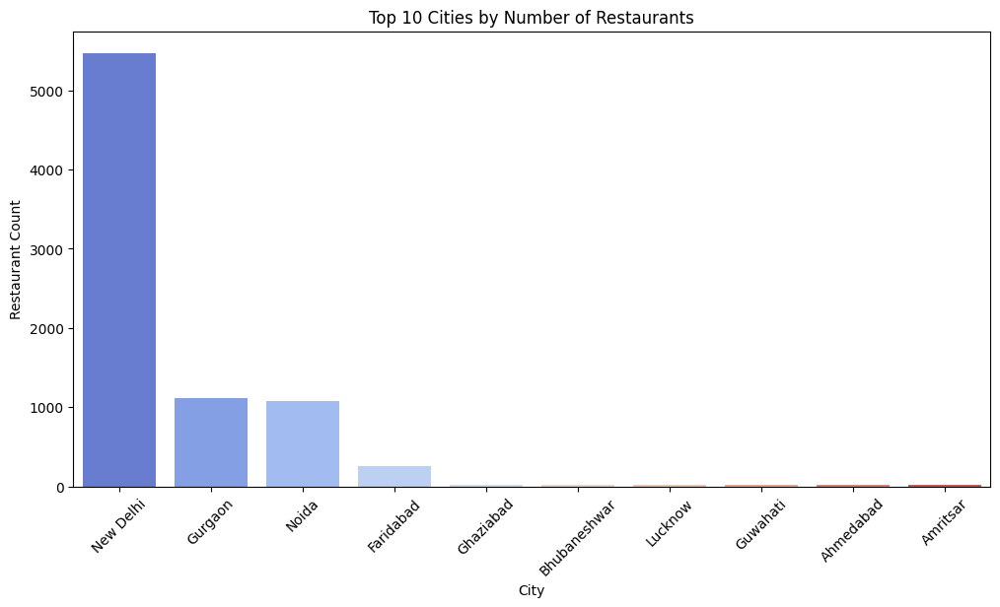

In [5]:

plt.figure(figsize=(12,6))
sns.barplot(x=city_stats.head(10).index, y=city_stats.head(10)['Restaurant Count'], palette='coolwarm')
plt.title("Top 10 Cities by Number of Restaurants")
plt.xticks(rotation=45)
plt.show()


In [10]:

cuisine_counts = df.groupby('City')['Cuisines'].agg(lambda x: x.value_counts().index[0])
cuisine_counts.head(10)


,Cuisines
City,
Abu Dhabi,American
Agra,"North Indian, Mughlai"
Ahmedabad,"Chinese, Italian, North Indian, Mexican, Medit..."
Albany,Unknown
Allahabad,"North Indian, Chinese"
Amritsar,North Indian
Ankara,"Kebab, Turkish Pizza"
Armidale,"Bar Food, Steak"
Athens,"American, Italian, Pizza"
